In [21]:
# Se importan las librerías necesarias para el proyecto
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import Adagrad
import numpy as np
import pandas as pd
import itertools
import math
import os
import cv2
import random
from tqdm import tqdm
from random import shuffle
from pathlib import Path
from sklearn.metrics import confusion_matrix
from skimage import io
from skimage.transform import rescale, resize, downscale_local_mean
from random import randint, choice, choices
from tensorflow import keras
from PIL import Image
from sklearn.metrics import classification_report, accuracy_score, f1_score, recall_score, precision_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical


In [22]:
DIR_DATASET = '/content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full'
CATEGORIES = ["Camisas Casuales", "Chaquetas Casuales", "Pantalones Casuales", "Zapatos Casuales","Chaquetas elegantes","Camisas elegantes"]

# Tamaño del resize de las imágenes
IMG_SIZE = 512

# Crea un objeto LabelEncoder para convertir las etiquetas de texto a números enteros
le = LabelEncoder()
le.fit(CATEGORIES)
n_class = len(CATEGORIES)
frac_dataset=0.8

In [23]:
# Lista para almacenar las rutas de las imágenes de entrenamiento y prueba
datos_train = []
datos_test = []

# Recorre todas las categorías
for nombre_categoria in CATEGORIES:
    ruta_categoria = os.path.join(DIR_DATASET, nombre_categoria)
    rutas_imagenes = os.listdir(ruta_categoria)
    random.shuffle(rutas_imagenes)
    num_imagenes_entrenamiento = int(len(rutas_imagenes) * frac_dataset)
    datos_train.extend([os.path.join(ruta_categoria, imagen) for imagen in rutas_imagenes[:num_imagenes_entrenamiento]])
    datos_test.extend([os.path.join(ruta_categoria, imagen) for imagen in rutas_imagenes[num_imagenes_entrenamiento:]])

# Definir las etiquetas de las muestras de entrenamiento
etiquetas_train = []
for imagen in datos_train:
    categoria = imagen.split(os.path.sep)[-2]
    etiquetas_train.append(categoria)

# Definir las etiquetas de las muestras de prueba
etiquetas_test = []
for imagen in datos_test:
    categoria = imagen.split(os.path.sep)[-2]
    etiquetas_test.append(categoria)

# Convierte las etiquetas de texto a números enteros
labels_train = le.transform(etiquetas_train)
labels_test = le.transform(etiquetas_test)

# Convierte las etiquetas en codificación one-hot
labels_train = to_categorical(labels_train, num_classes=n_class)
labels_test = to_categorical(labels_test, num_classes=n_class)

In [24]:
def procesar_imagen(ruta_imagen, etiqueta):
    imagen = tf.io.read_file(ruta_imagen)
    imagen = tf.image.decode_jpeg(imagen, channels=num_canales)
    imagen = tf.image.resize(imagen, [IMG_SIZE, IMG_SIZE])
    imagen = tf.cast(imagen, tf.float32) / 255.0

    return imagen, etiqueta

In [25]:
# Función para preprocesar las imágenes
def preprocess_image(image_path):
    print("Procesando imagen:", image_path)  # Agregamos esta línea para mostrar la ruta de la imagen
    # Lee la imagen en color
    image = cv2.imread(image_path)
    # Cambia la imagen a escala de grises
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Redimensiona la imagen al tamaño deseado
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    # Añade una dimensión adicional para el canal (1 para escala de grises)
    image = np.expand_dims(image, axis=-1)
    # Normaliza los valores de píxeles al rango [0, 1]
    image = image.astype('float32') / 255.0
    return image

# Carga las imágenes de entrenamiento y prueba
images_train = []
for image_path in datos_train:
    image = preprocess_image(image_path)
    images_train.append(image)

images_test = []
for image_path in datos_test:
    image = preprocess_image(image_path)
    images_test.append(image)

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full/Camisas Casuales/16e59add-f4dc-42ed-9d0b-117b82ade746.jpg
Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full/Camisas Casuales/365db9df-dc5c-4c34-9c6e-0b5f4f094508.jpg
Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full/Camisas Casuales/1dd614d3-5325-4ed0-b9df-b3753b7ed094.jpg
Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full/Camisas Casuales/77117568-170e-4fa6-ad38-ba45bcbbc848.jpg
Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full/Camisas Casuales/9b36e0d7-5f90-41ee-b0f1-1091e35a5d8e.jpg
Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/Dataset Full/Camisas Casuales/4245ab7f-8b51-407d-a63b-a3c7fc5007c4.jpg
Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/D

In [26]:
# Construir el modelo
# Construir el modelo con una ligera variación
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 1)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(n_class, activation='softmax'))


# Compilar el modelo
model.compile(optimizer='adam', loss = 'binary_crossentropy', metrics=['accuracy'])


# Entrenar el modelo
model.fit(np.array(images_train), labels_train, epochs=25, batch_size=32, validation_data=(np.array(images_test), labels_test))

Epoch 1/25
59/59 [==============================] - 15s 226ms/step - loss: 0.7620 - accuracy: 0.4075 - val_loss: 0.2894 - val_accuracy: 0.6360
Epoch 2/25
59/59 [==============================] - 12s 197ms/step - loss: 0.2265 - accuracy: 0.7134 - val_loss: 0.3391 - val_accuracy: 0.5717
Epoch 3/25
59/59 [==============================] - 12s 198ms/step - loss: 0.1295 - accuracy: 0.8683 - val_loss: 0.2577 - val_accuracy: 0.7045
Epoch 4/25
59/59 [==============================] - 12s 196ms/step - loss: 0.0832 - accuracy: 0.9323 - val_loss: 0.3121 - val_accuracy: 0.7131
Epoch 5/25
59/59 [==============================] - 12s 207ms/step - loss: 0.0266 - accuracy: 0.9860 - val_loss: 0.3406 - val_accuracy: 0.7302
Epoch 6/25
59/59 [==============================] - 12s 206ms/step - loss: 0.0147 - accuracy: 0.9935 - val_loss: 0.4157 - val_accuracy: 0.6916
Epoch 7/25
59/59 [==============================] - 12s 204ms/step - loss: 0.0306 - accuracy: 0.9828 - val_loss: 0.3881 - val_accuracy: 0.6938

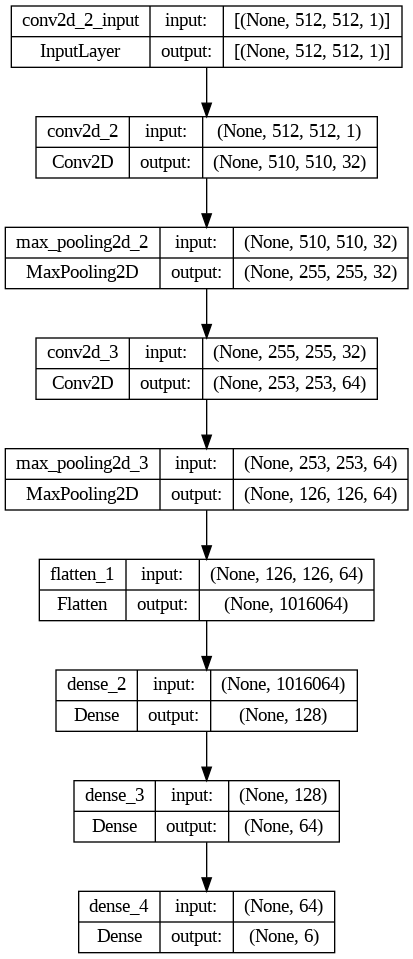

In [27]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [28]:
# Evaluar el modelo en el conjunto de prueba
loss, accuracy = model.evaluate(np.array(images_test), labels_test)
print("Pérdida en el conjunto de prueba:", loss)
print("Precisión en el conjunto de prueba:", accuracy)

15/15 [==============================] - 1s 59ms/step - loss: 0.6592 - accuracy: 0.7623
Pérdida en el conjunto de prueba: 0.6591510772705078
Precisión en el conjunto de prueba: 0.762312650680542


Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/camisa2.jpg
1/1 [==============================] - 0s 101ms/step


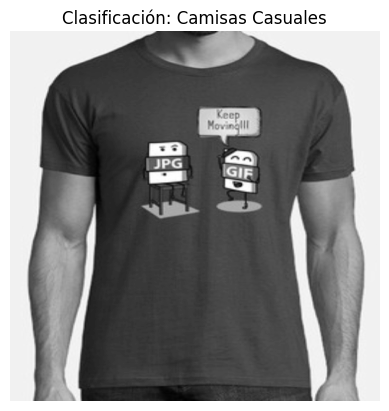

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/elegante1.jpg
1/1 [==============================] - 0s 33ms/step


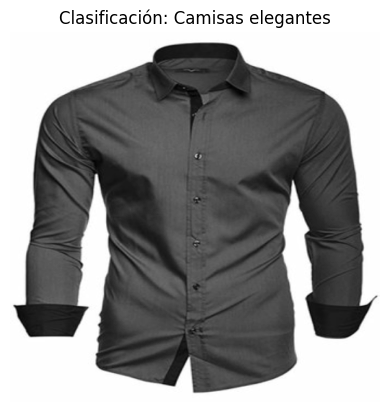

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/zapto1.jpg
1/1 [==============================] - 0s 29ms/step


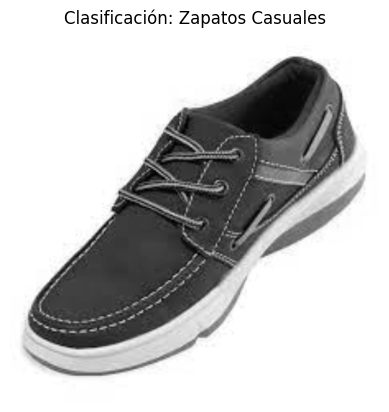

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/zapato2.jpg
1/1 [==============================] - 0s 29ms/step


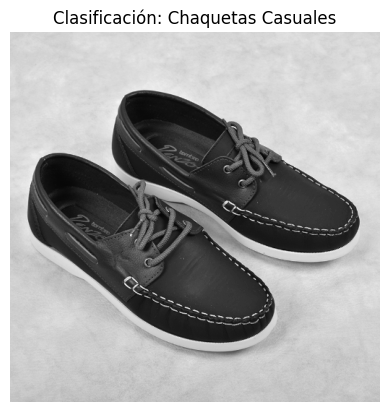

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/pantalon1.webp
1/1 [==============================] - 0s 29ms/step


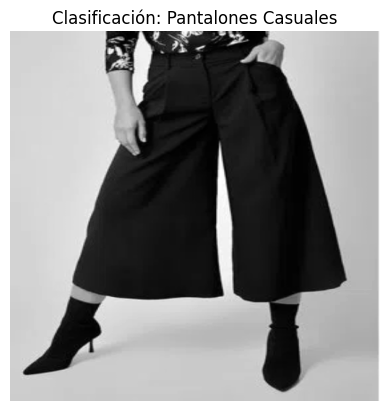

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fb0e4090-f7e7-424a-aa85-44daffcea9a1.jpg
1/1 [==============================] - 0s 28ms/step


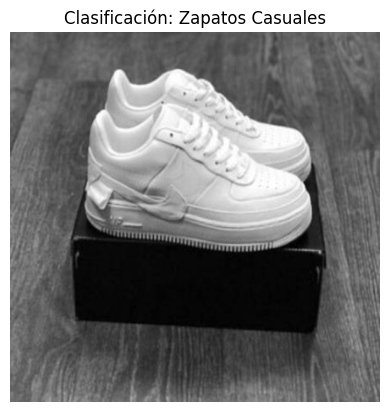

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f72b6737-47de-4b8f-a1f0-a874d3d591b6.jpg
1/1 [==============================] - 0s 19ms/step


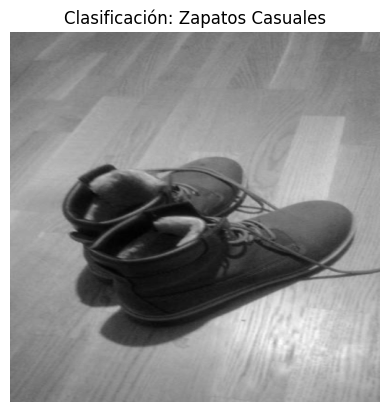

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fe177283-e19e-479e-a495-fdd3a477bd4a.jpg
1/1 [==============================] - 0s 28ms/step


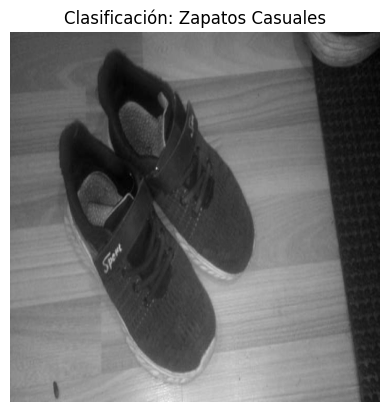

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f744c13f-1b8f-44ef-a45c-4b8e65771901.jpg
1/1 [==============================] - 0s 18ms/step


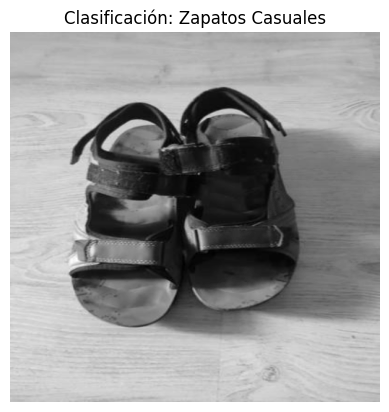

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f9712e54-9a7b-4e96-b99a-c43d2832a0e5.jpg
1/1 [==============================] - 0s 27ms/step


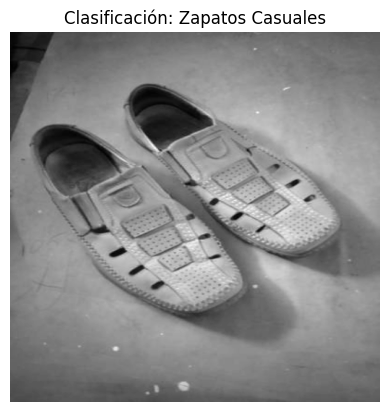

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fb9e862c-8c64-4f23-b1e9-e734ec797436.jpg
1/1 [==============================] - 0s 19ms/step


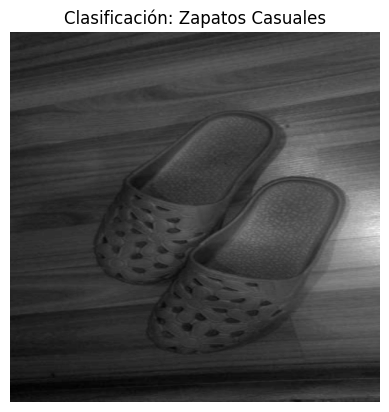

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de ff5b1764-1272-41bf-a324-98f1b9f13fae.jpg
1/1 [==============================] - 0s 21ms/step


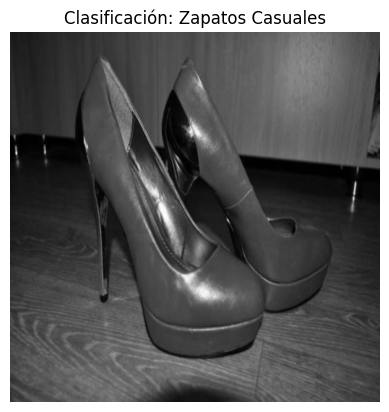

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f56febf3-452e-4eb2-a514-4b18f950c807.jpg
1/1 [==============================] - 0s 25ms/step


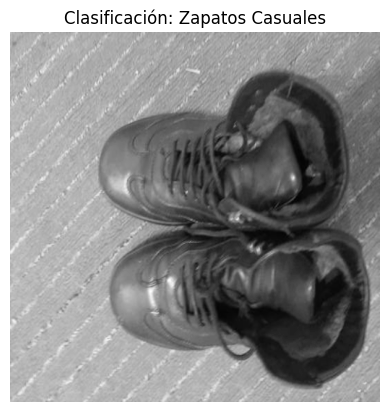

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f8a7abd7-f479-40d0-ab45-fcdaef82e1c5.jpg
1/1 [==============================] - 0s 22ms/step


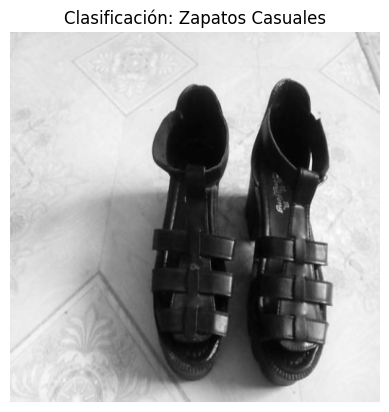

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fbdddc68-0c17-47fb-a6a4-28f9564f44fb.jpg
1/1 [==============================] - 0s 23ms/step


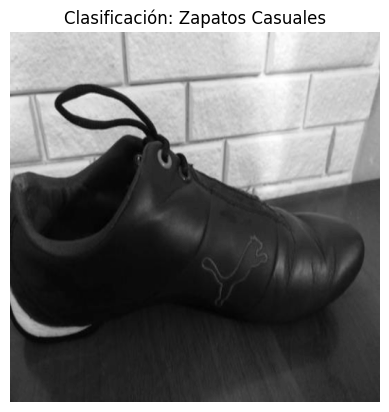

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fa5fe172-a5b0-465a-bf25-7e22e7af43cf.jpg
1/1 [==============================] - 0s 23ms/step


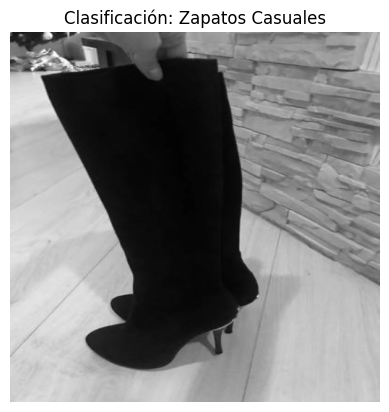

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f7b209c5-c0c1-4ff8-b643-0b0dbdd1d600.jpg
1/1 [==============================] - 0s 28ms/step


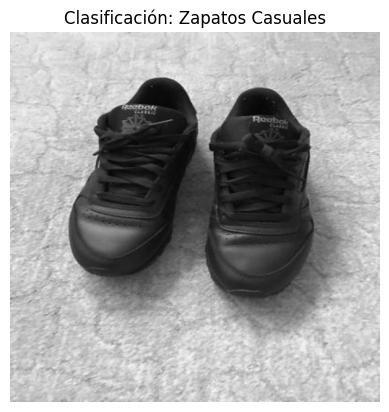

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fbdb72f7-0d7f-4c8b-b8b3-0d90c96bffa7.jpg
1/1 [==============================] - 0s 28ms/step


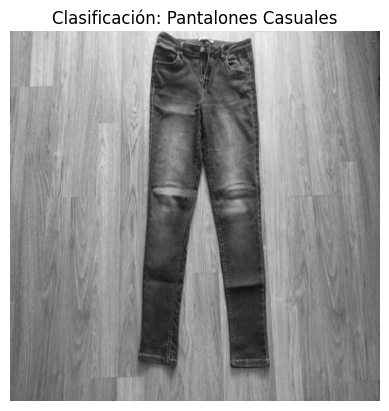

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fe5529c2-a08d-47cc-8e18-f05ca21491e6.jpg
1/1 [==============================] - 0s 23ms/step


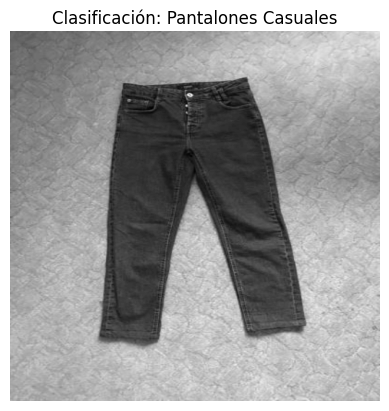

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fe61785e-dadc-4195-9442-6bab7e94579f.jpg
1/1 [==============================] - 0s 21ms/step


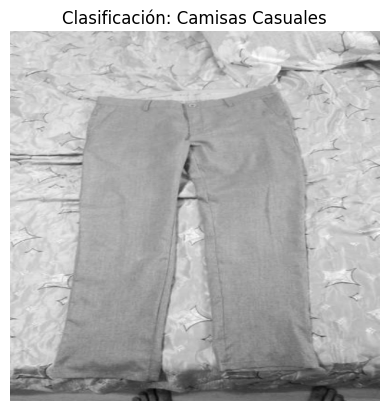

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fc532419-917e-46f4-bd63-f6edbd22f016.jpg
1/1 [==============================] - 0s 27ms/step


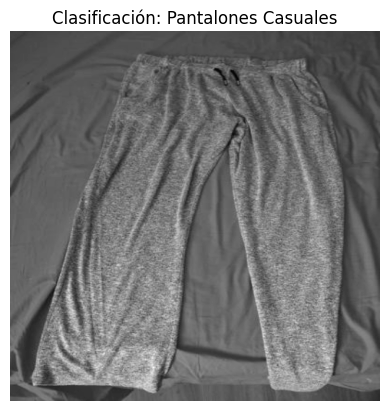

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fe0ae2fe-9910-4f3f-a7ab-3b6400c9e0b2.jpg
1/1 [==============================] - 0s 20ms/step


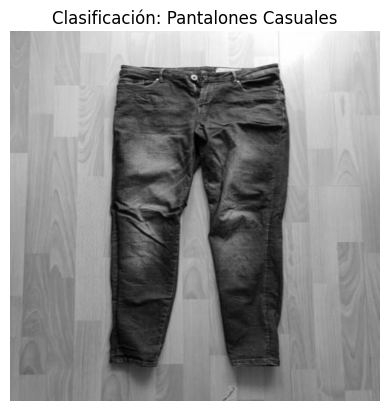

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de ff83e404-50b6-4956-af52-590e0654e58a.jpg
1/1 [==============================] - 0s 27ms/step


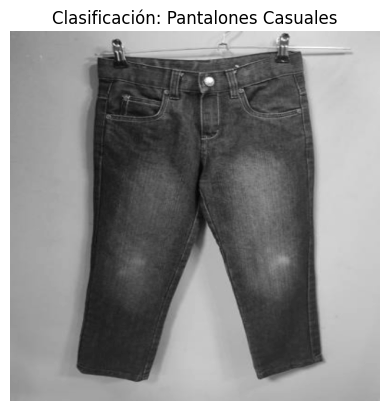

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fff22e21-1b3a-474a-861d-51a92bab6cc0.jpg
1/1 [==============================] - 0s 32ms/step


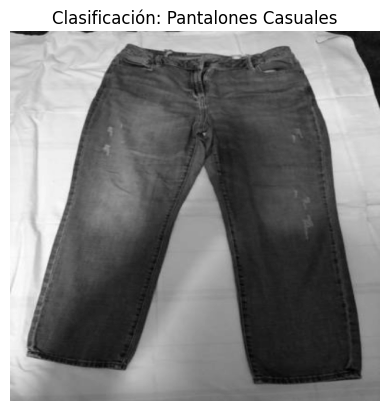

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fb59bc3a-fdb9-498c-99a6-de73d500f643.jpg
1/1 [==============================] - 0s 22ms/step


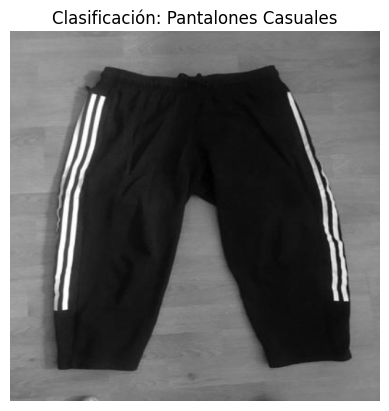

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fd01c487-88aa-48fc-a9f0-f0bb4ea9e3fb.jpg
1/1 [==============================] - 0s 25ms/step


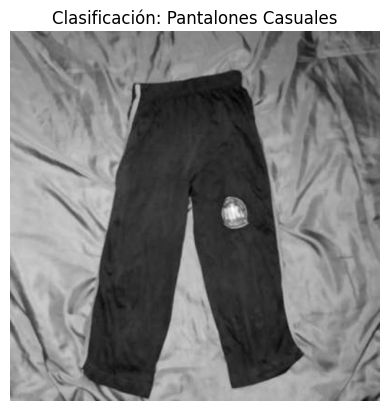

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fadf240e-8292-42fd-b1ef-76671903630e.jpg
1/1 [==============================] - 0s 29ms/step


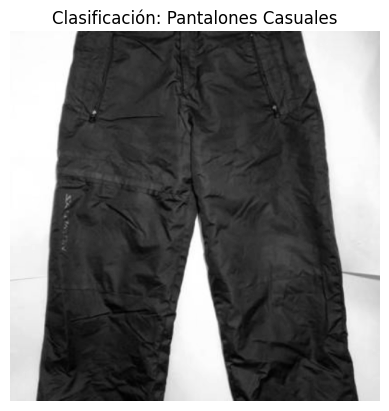

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fac591c6-d884-44bf-9f73-3f9dd8e39c0a.jpg
1/1 [==============================] - 0s 23ms/step


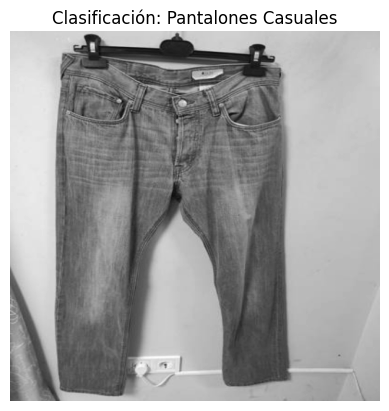

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fd2d5fd1-2572-48d1-a089-f44039543b50.jpg
1/1 [==============================] - 0s 34ms/step


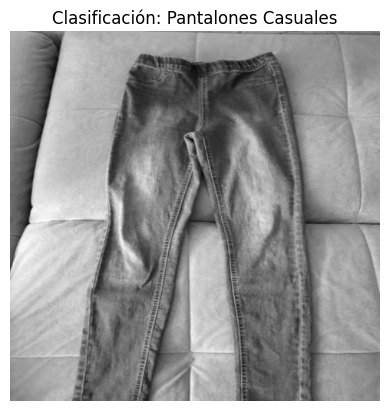

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de yellow-classic-jacket-isolated-women-s-office-classic-yellow-suit-jackets-isolated-on-white-background-free-photo.jpg
1/1 [==============================] - 0s 18ms/step


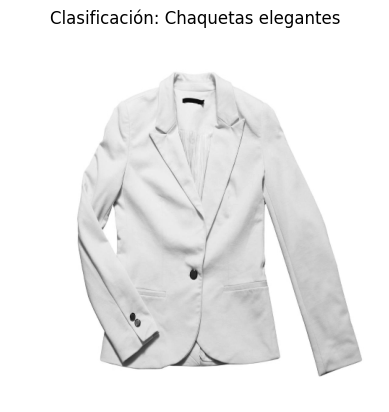

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de Sa32d576594e446a7a89236e2c7ad54e3T.jpg
1/1 [==============================] - 0s 25ms/step


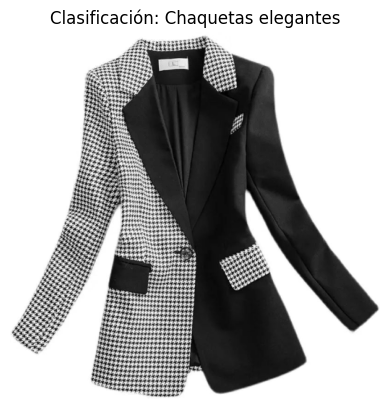

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de Traje-blanco-de-cuello-marinero-para-mujer-chaqueta-elegante-de-manga-larga-abrigo-de-Tweed-negro.jpg_Q90.jpg_.webp
1/1 [==============================] - 0s 39ms/step


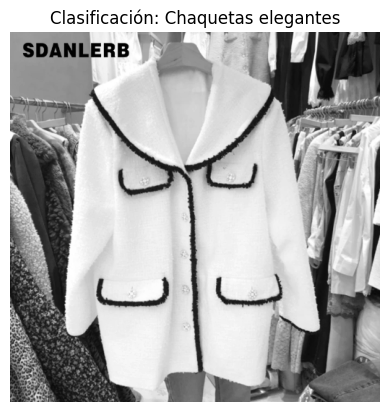

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de w1080.webp
1/1 [==============================] - 0s 28ms/step


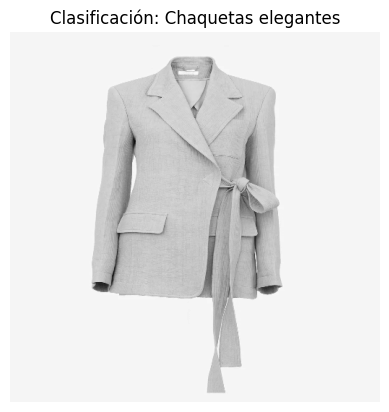

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de vila-clothes-vicris-suede-jacket-noos-chaqueta-marron-oak-brown-44-talla-del-fabricante-x-large-para-mujer-60198.jpg
1/1 [==============================] - 0s 27ms/step


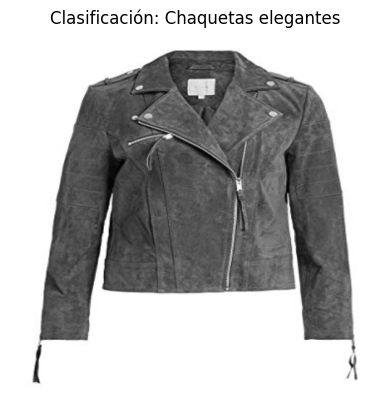

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de SAVCT003.jpg
1/1 [==============================] - 0s 25ms/step


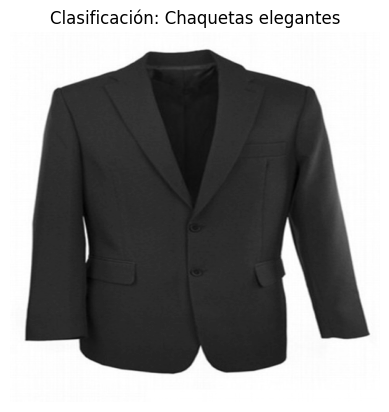

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de vero-moda-mujer-de-cuero-cazadora-de-cuero-vmjose-short-faux-suede-jacket-boos-para-mujer.jpg
1/1 [==============================] - 0s 32ms/step


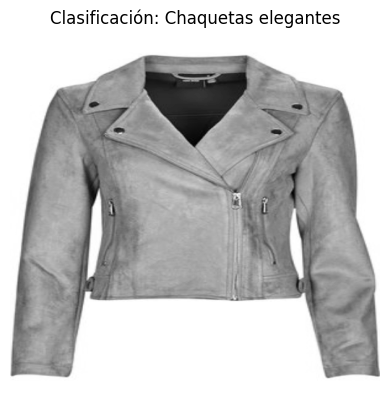

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de spartoo-cazadora-de-cuero-onlava-para-mujer.webp
1/1 [==============================] - 0s 25ms/step


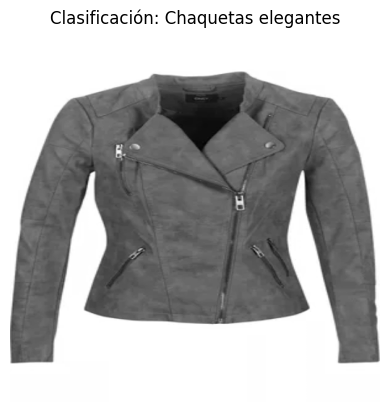

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de Tangada-Chaqueta-corta-de-Tweed-verde-para-mujer-abrigo-Vintage-de-manga-larga-prendas-de-vestir.jpg_640x640.jpg
1/1 [==============================] - 0s 25ms/step


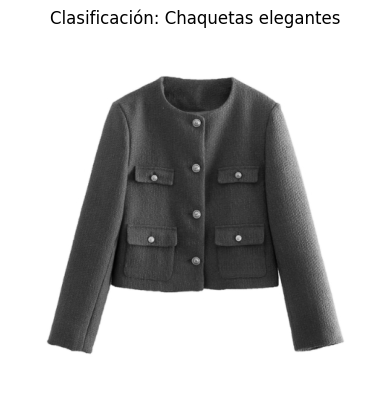

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de yynuda-traje-de-mujer-de-2-piezas-de-ajuste-delgado-de-un-boton-chaqueta-chaqueta-de-trabajo-de-oficina-pantalones-trajes-de-falda-trajes-14583-2.jpg
1/1 [==============================] - 0s 34ms/step


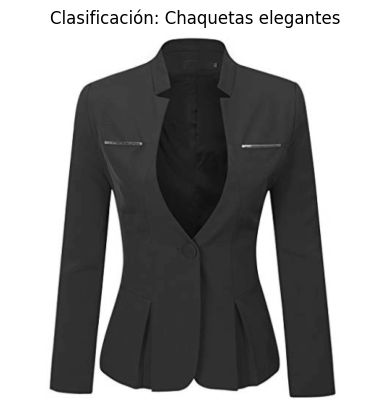

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de S09d4825c0acb4213ae6f4f286f6d3307z.jpg_640x640Q90.jpg_.webp
1/1 [==============================] - 0s 30ms/step


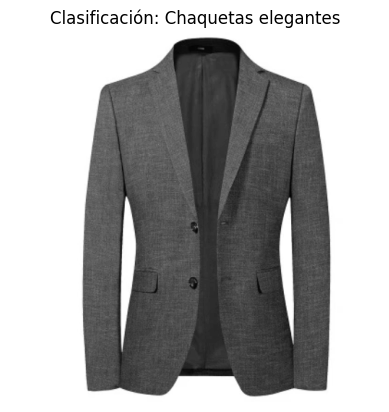

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de S7fa011fb84954c45b8b94127b771dc4cr.jpg
1/1 [==============================] - 0s 27ms/step


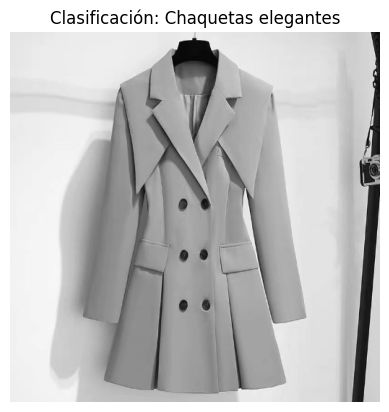

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fbefa9a6-5ed8-47d7-97f7-c57378457399.jpg
1/1 [==============================] - 0s 42ms/step


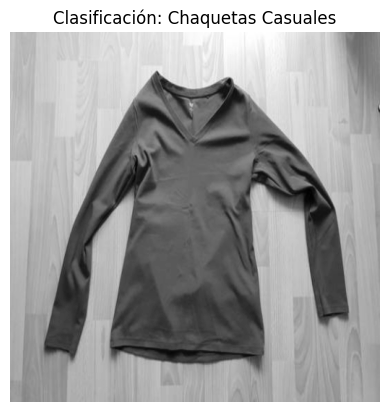

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fc2c397f-29cb-4524-b797-5bda35da7d18.jpg
1/1 [==============================] - 0s 43ms/step


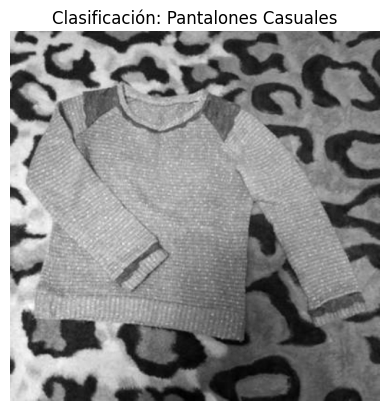

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fc445dc0-d718-4478-845f-a0223a74ebb8.jpg
1/1 [==============================] - 0s 53ms/step


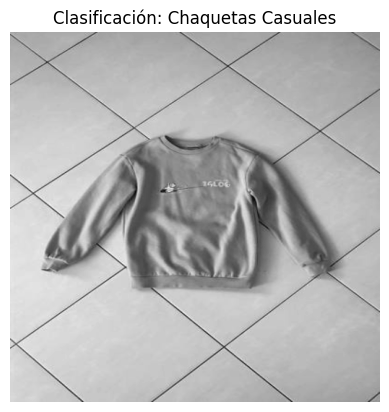

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fc1241ee-8540-4321-ad77-6dfc2dff7802.jpg
1/1 [==============================] - 0s 60ms/step


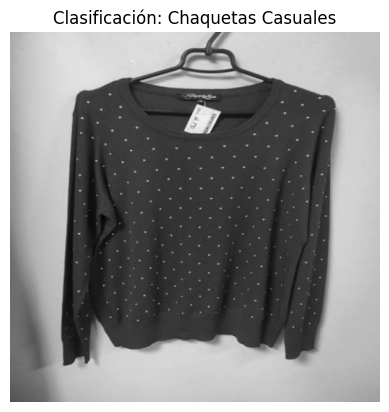

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de ff373bf4-7782-401d-acdc-179cbd9e4683.jpg
1/1 [==============================] - 0s 61ms/step


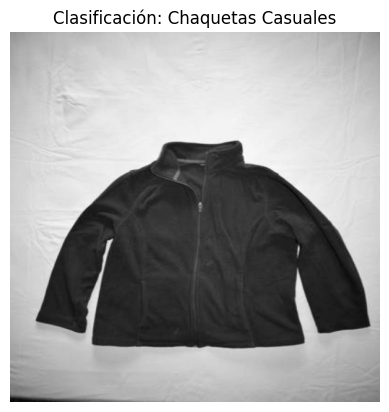

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fd24aa3a-2cce-49a4-b905-a8cd33f35d91.jpg
1/1 [==============================] - 0s 51ms/step


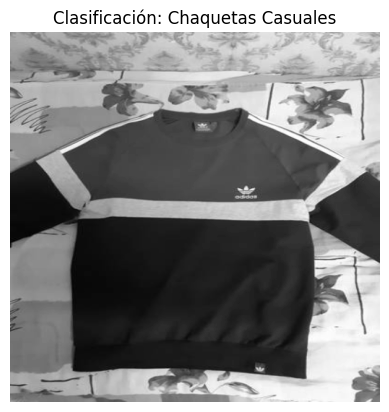

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fca6b5f0-8fd2-446a-a226-117d395f7c9d.jpg
1/1 [==============================] - 0s 64ms/step


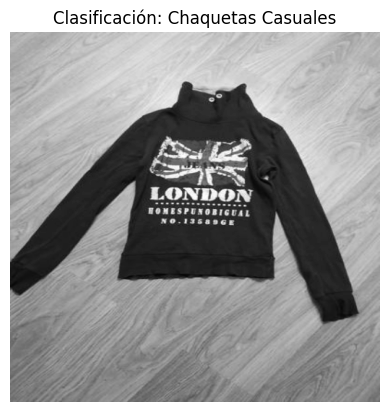

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fedeaabe-47ca-4fb4-949f-0e8a91141bfe.jpg
1/1 [==============================] - 0s 29ms/step


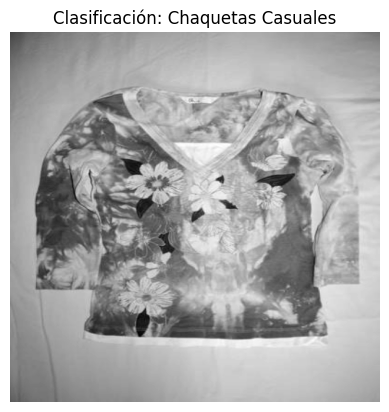

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fe1ba208-32c7-48ad-aab9-488f33a3f983.jpg
1/1 [==============================] - 0s 42ms/step


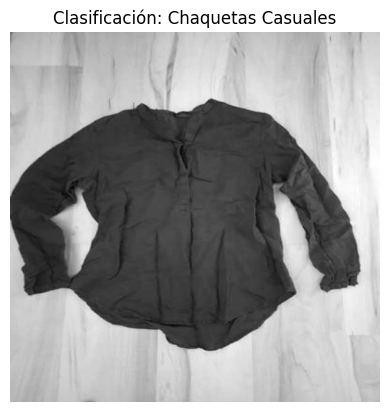

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fec3f552-e894-4737-8867-a9447f68f6be.jpg
1/1 [==============================] - 0s 53ms/step


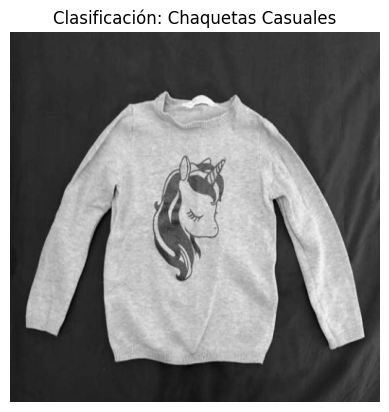

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fbdcc9a6-1363-46a5-8df7-1cfd715420c3.jpg
1/1 [==============================] - 0s 30ms/step


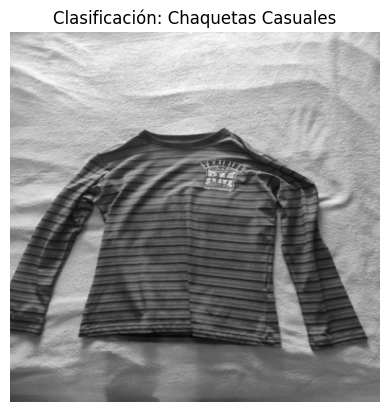

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fce53abd-5937-4881-bb47-2ef68f6da985.jpg
1/1 [==============================] - 0s 29ms/step


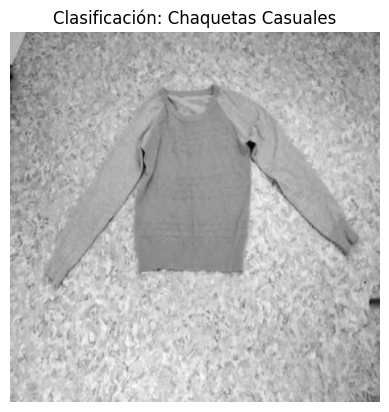

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (44).jpeg
1/1 [==============================] - 0s 30ms/step


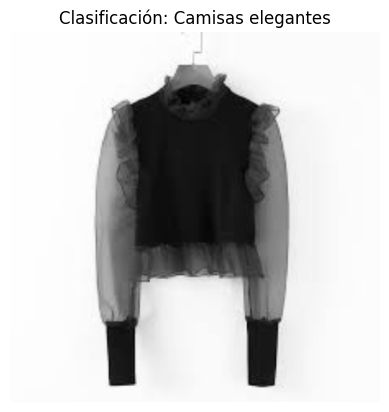

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de mujer-top-de-organdc3ad-y-encaje-negro-camisas-y-tops-valentino.jpg
1/1 [==============================] - 0s 30ms/step


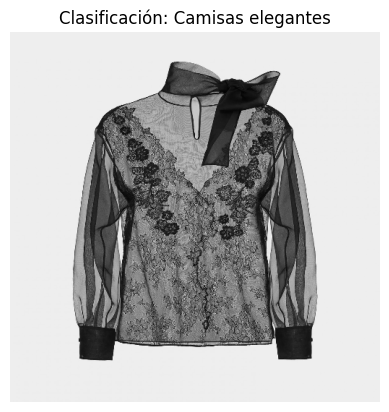

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (45).jpeg
1/1 [==============================] - 0s 32ms/step


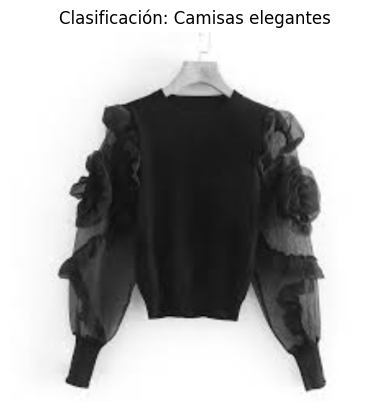

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (48).jpeg
1/1 [==============================] - 0s 33ms/step


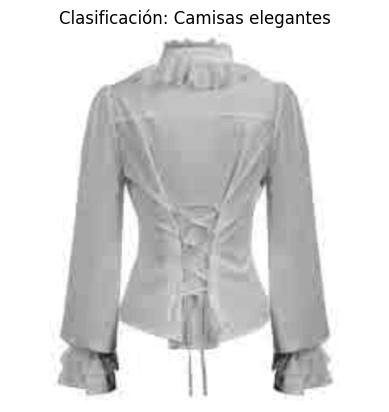

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (50).jpeg
1/1 [==============================] - 0s 27ms/step


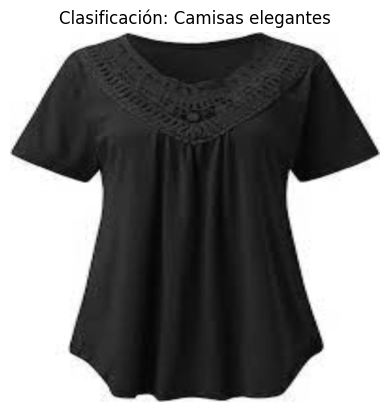

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de Venta-al-por-mayor-Nuevo-blusa-VOGUEIN-rosa-con-volantes-y-cuello-de-manga-larga.jpg_640x640.jpg
1/1 [==============================] - 0s 25ms/step


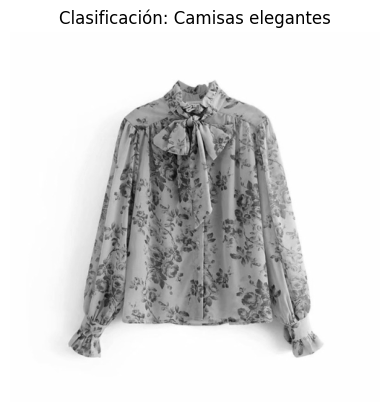

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de premier-hombre-manga-corta-camisa-manga-corta-pr247-para-hombre.jpg
1/1 [==============================] - 0s 26ms/step


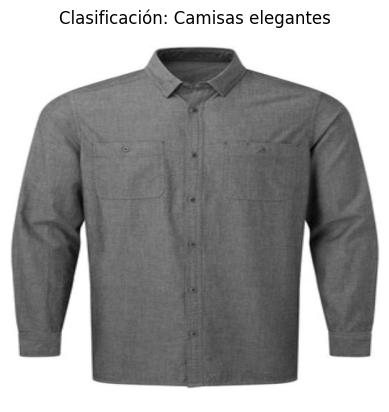

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (46).jpeg
1/1 [==============================] - 0s 25ms/step


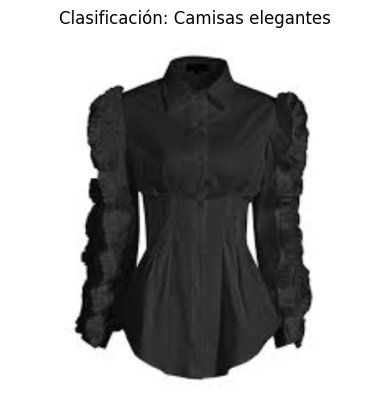

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (47).jpeg
1/1 [==============================] - 0s 26ms/step


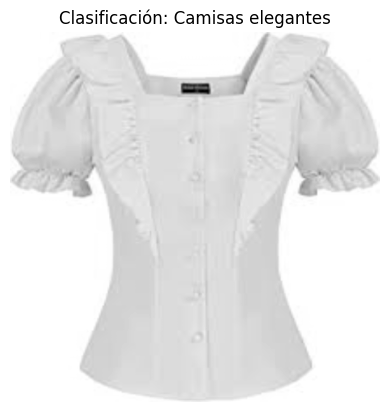

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images.jpeg
1/1 [==============================] - 0s 28ms/step


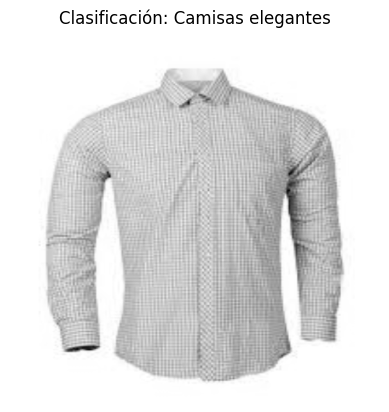

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (43).jpeg
1/1 [==============================] - 0s 25ms/step


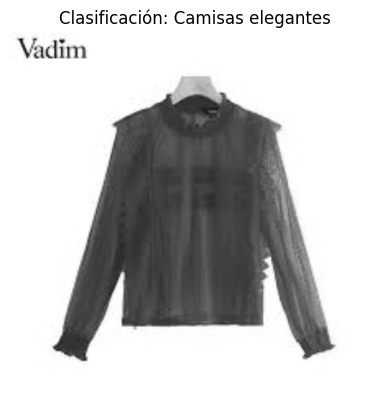

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de images (49).jpeg
1/1 [==============================] - 0s 25ms/step


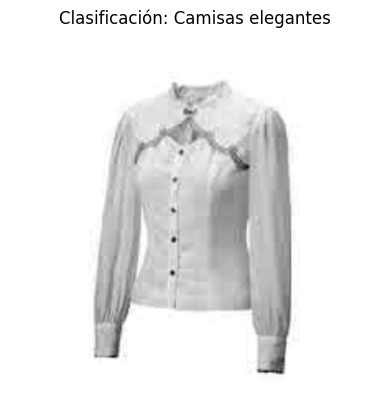

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f27fed74-1495-44df-b129-8b346c3c57eb.jpg
1/1 [==============================] - 0s 26ms/step


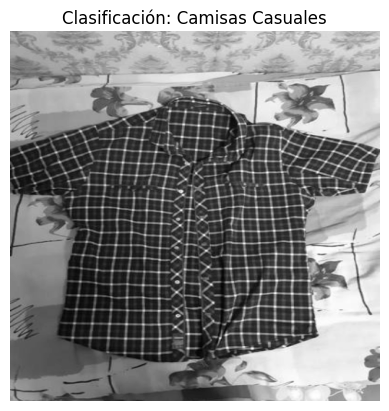

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fcd12553-82a2-4235-9695-438e001a531e.jpg
1/1 [==============================] - 0s 26ms/step


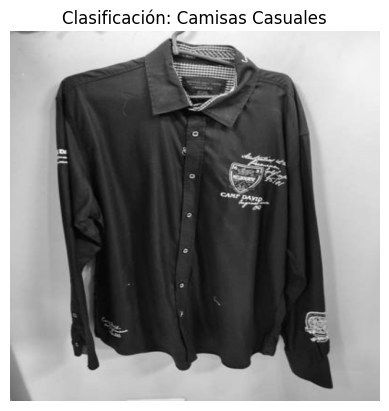

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f799a68f-786f-4c7a-84a3-37f178faa418.jpg
1/1 [==============================] - 0s 25ms/step


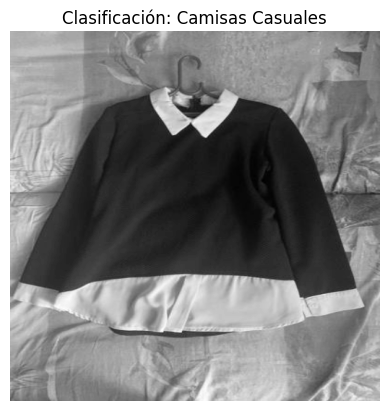

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fc33993c-6696-4a4e-be6a-dc6f5c08eb09.jpg
1/1 [==============================] - 0s 29ms/step


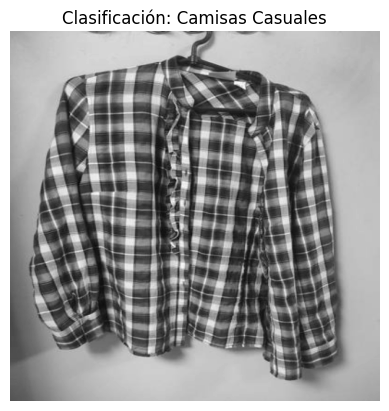

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de ff0535f7-c9f4-47f7-8aae-373aa3e09f04.jpg
1/1 [==============================] - 0s 25ms/step


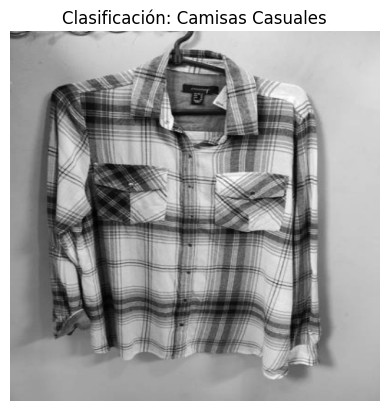

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fd28f175-6ac7-4506-b67b-ae1bcbfc5c61.jpg
1/1 [==============================] - 0s 26ms/step


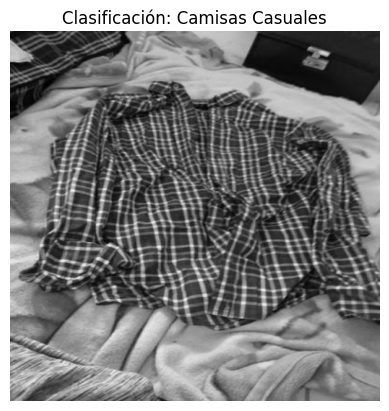

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de fe7ca6a3-50a8-4377-9e67-a80652d1594a.jpg
1/1 [==============================] - 0s 24ms/step


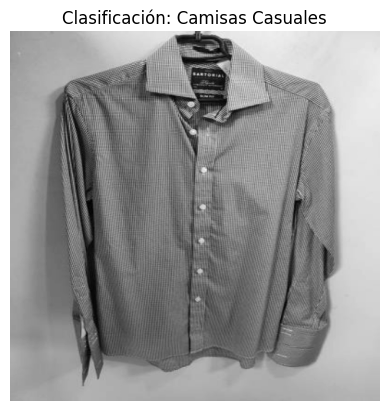

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f53dc5e8-9625-4fb4-85f0-3c773c884545.jpg
1/1 [==============================] - 0s 25ms/step


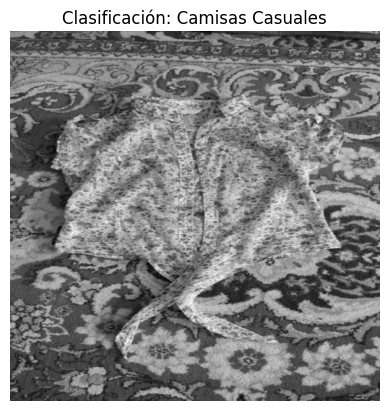

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de efccde38-dc9d-4765-98d8-8cdf7bd4fc72.jpg
1/1 [==============================] - 0s 27ms/step


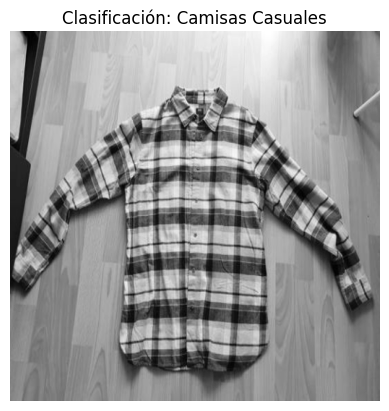

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f43f802f-7ece-4bdd-994c-c2ed526d279f.jpg
1/1 [==============================] - 0s 26ms/step


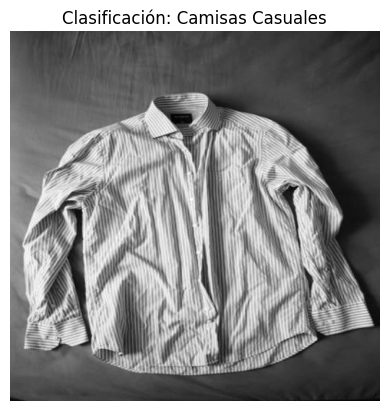

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de f0883a37-c8a5-4862-bfab-73f61cec0a04.jpg
1/1 [==============================] - 0s 26ms/step


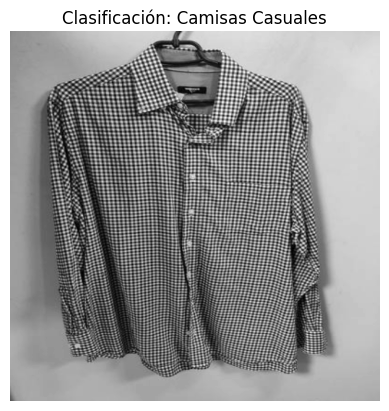

Procesando imagen: /content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas/Copia de ef4afaa2-ce6f-4063-83ad-beac8d201e67.jpg
1/1 [==============================] - 0s 25ms/step


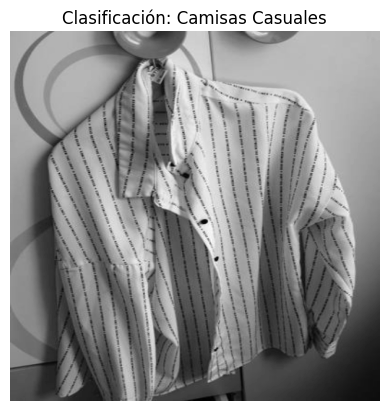

In [29]:
import os
import matplotlib.pyplot as plt

# Ruta de la carpeta de imágenes de prueba
folder_path = "/content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/Dataset/pruebas"

# Obtener la lista de archivos en la carpeta
image_files = os.listdir(folder_path)

# Recorrer todas las imágenes en la carpeta
for image_file in image_files:
    # Obtener la ruta completa de la imagen
    image_path = os.path.join(folder_path, image_file)

    # Preprocesar la imagen
    preprocessed_image = preprocess_image(image_path)

    # Realizar la predicción
    prediction = model.predict(np.expand_dims(preprocessed_image, axis=0))

    # Interpretar la predicción
    predicted_class_index = np.argmax(prediction)
    predicted_class_label = le.inverse_transform([predicted_class_index])[0]

    # Mostrar la imagen con su clasificación
    plt.imshow(preprocessed_image.squeeze(), cmap='gray')
    plt.title("Clasificación: " + predicted_class_label)
    plt.axis('off')
    plt.show()

In [35]:
# Guardar los pesos del modelo en un archivo
ruta_guardado = '/content/drive/Shareddrives/RNA Albio/Tareas/Trabajo 03/modelo.h5'
#model.save(ruta_guardado)